In [2]:
!pip install ultralytics opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 43.8 MB/s eta 0:00:00


In [3]:
import cv2
from ultralytics import YOLO
model = YOLO('yolov8n.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
import os
import shutil

os.makedirs("/content/frames", exist_ok=True)

for file in os.listdir("/content"):
    if file.lower().endswith((".jpg", ".png", ".jpeg")):
        shutil.move(f"/content/{file}", f"/content/frames/{file}")


In [5]:
import os

image_dir = "/content/frames"
images = sorted(os.listdir(image_dir))

for idx, img in enumerate(images, start=1):
    new_name = f"frame_{idx:03d}.jpg"
    os.rename(
        os.path.join(image_dir, img),
        os.path.join(image_dir, new_name)
    )


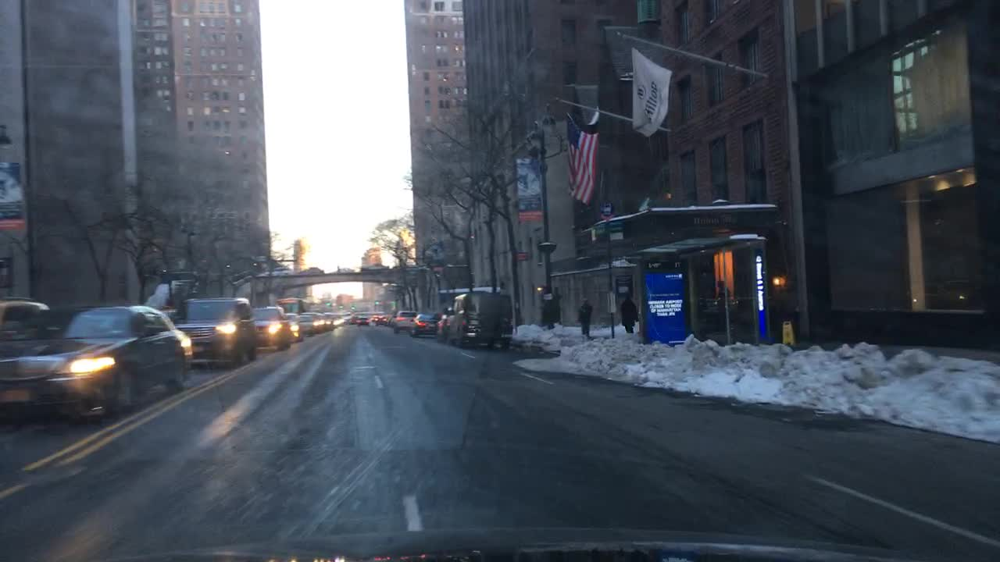

In [6]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("/content/frames/frame_013.jpg")
cv2_imshow(img)



0: 384x640 4 cars, 85.4ms
Speed: 16.0ms preprocess, 85.4ms inference, 53.4ms postprocess per image at shape (1, 3, 384, 640)


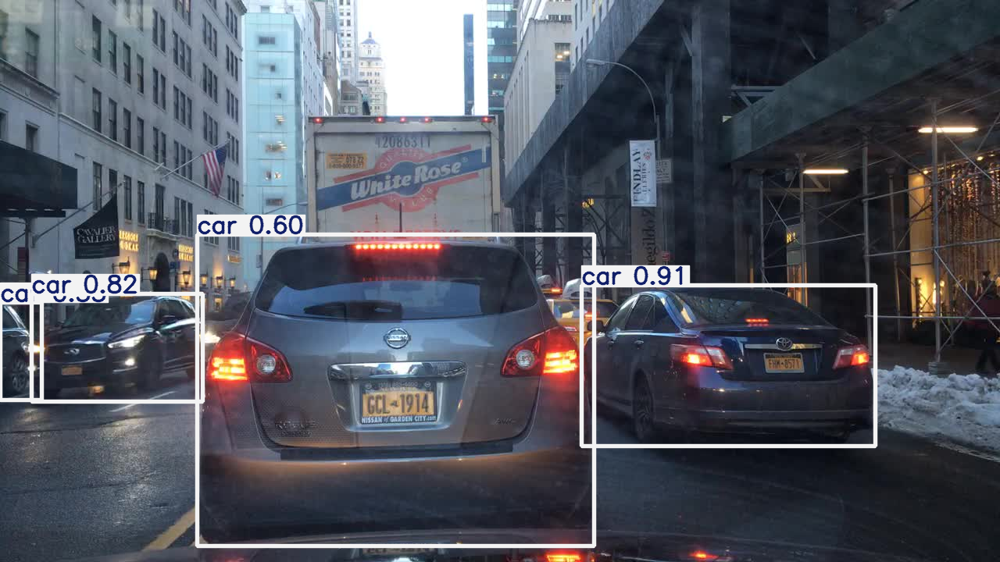


0: 384x640 5 cars, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


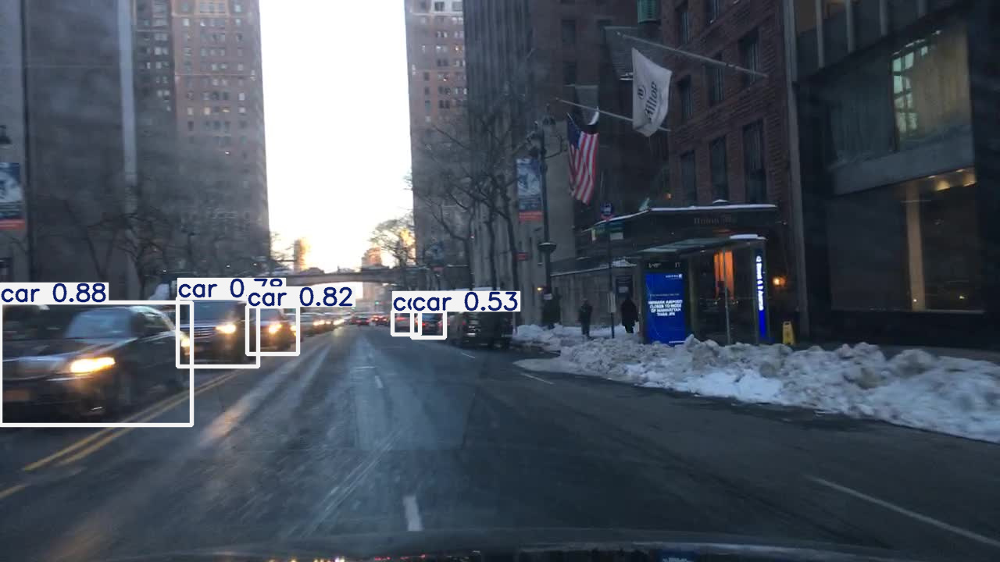


0: 384x640 1 car, 1 bus, 1 truck, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


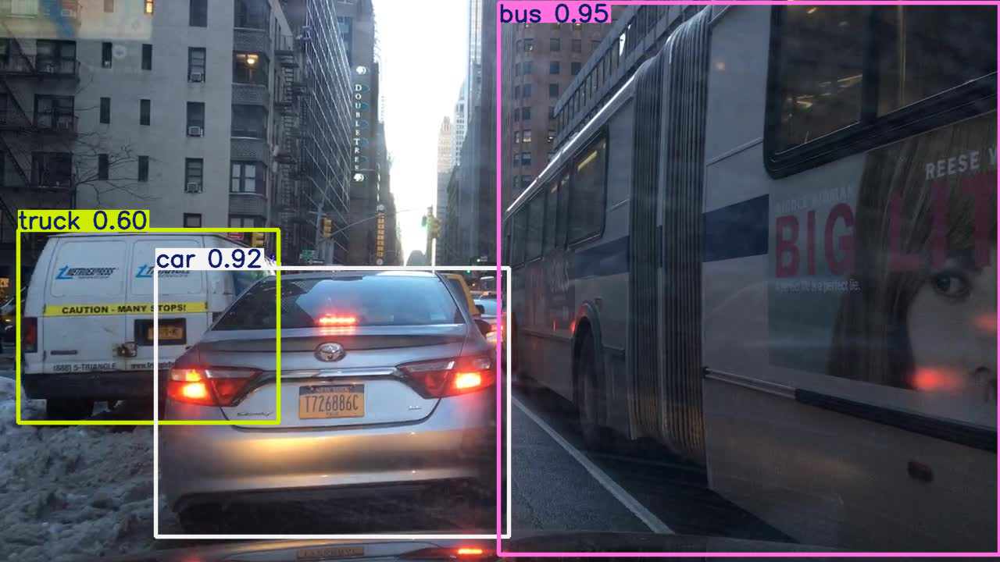


0: 384x640 3 cars, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


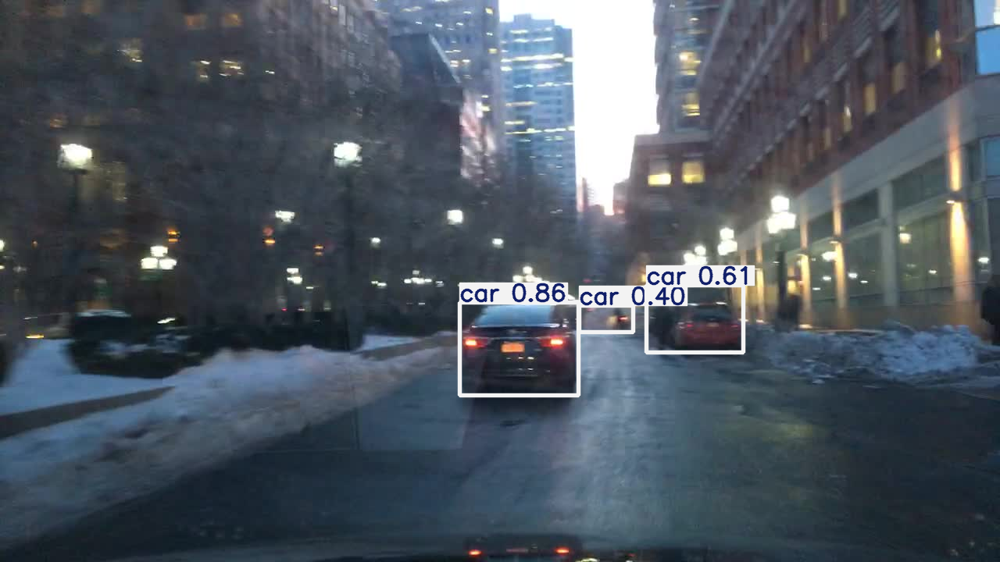


0: 384x640 2 cars, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


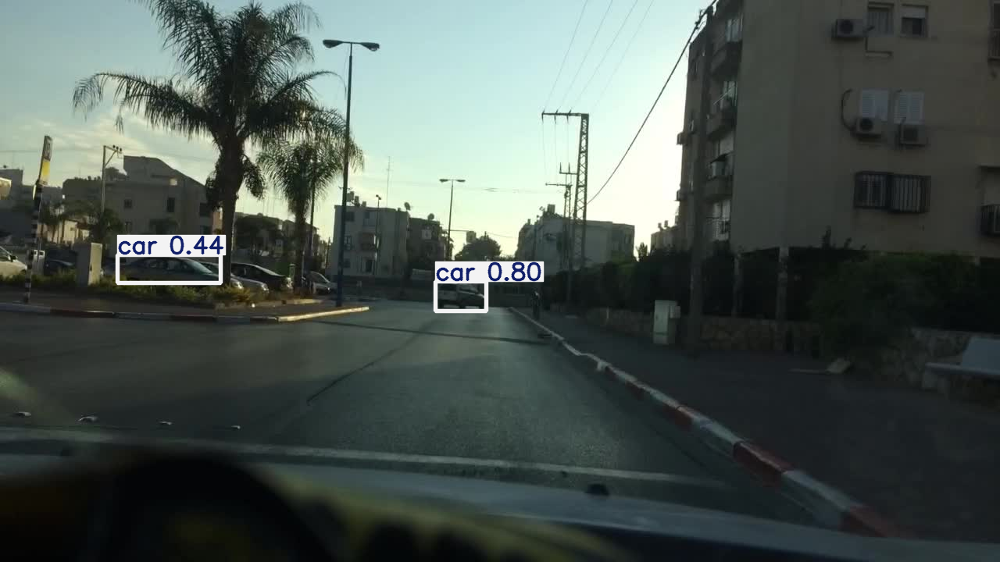

In [7]:
import cv2
import glob
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

model = YOLO("yolov8n.pt")

image_paths = sorted(glob.glob("/content/frames/*.jpg"))

for img_path in image_paths[11:16]:  # show first 5 only
    frame = cv2.imread(img_path)
    results = model(frame, conf=0.4)
    annotated = results[0].plot()
    cv2_imshow(annotated)



0: 384x640 1 car, 1 truck, 2 traffic lights, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


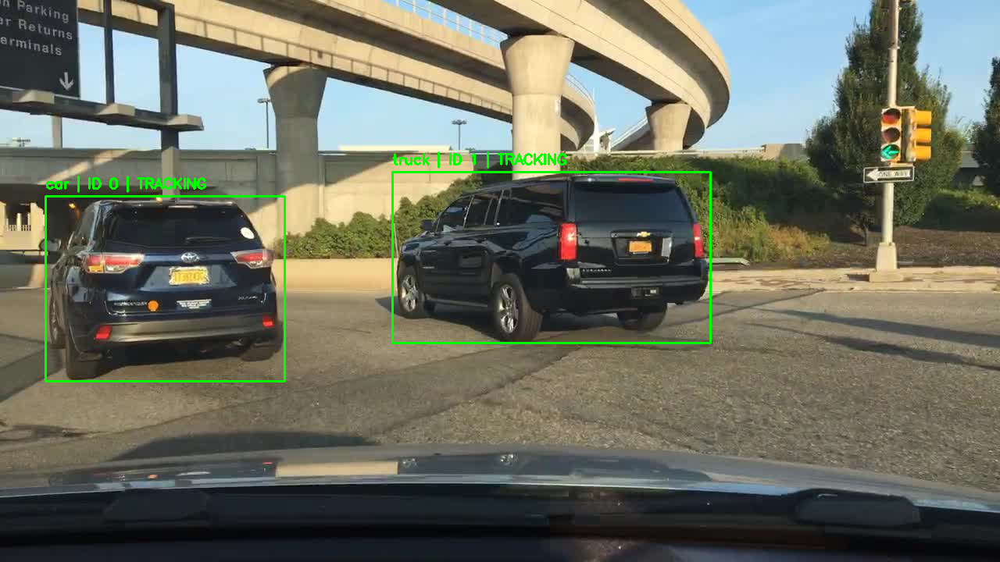


0: 384x640 (no detections), 7.9ms
Speed: 1.9ms preprocess, 7.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


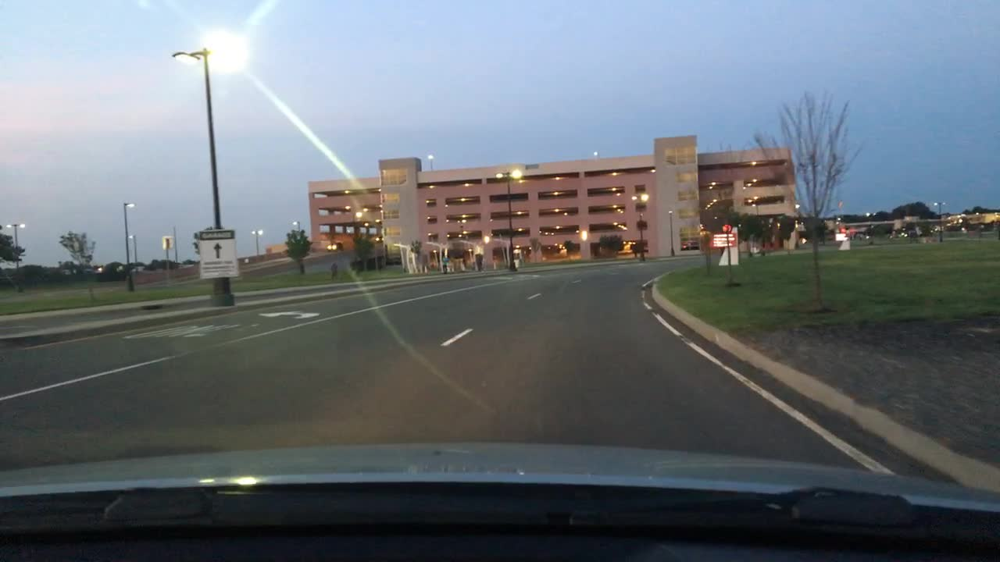


0: 384x640 5 cars, 10.0ms
Speed: 1.9ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


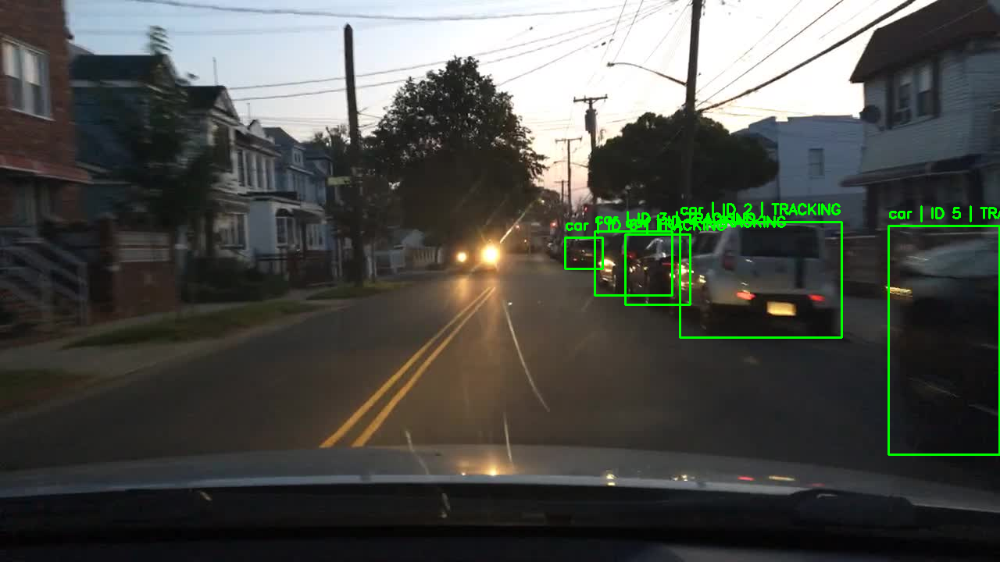


0: 384x640 1 person, 4 cars, 15.2ms
Speed: 2.1ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


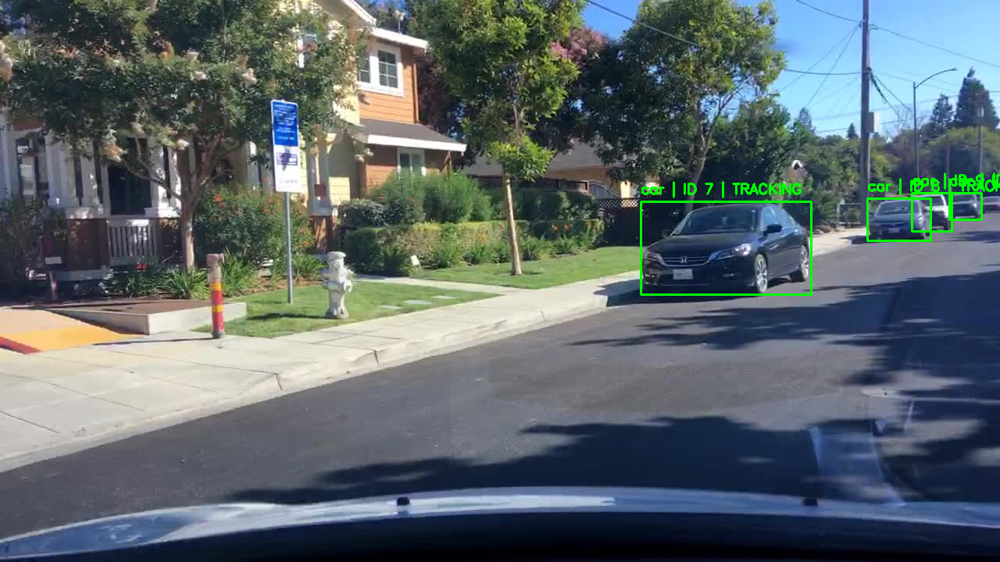


0: 384x640 1 person, 3 cars, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


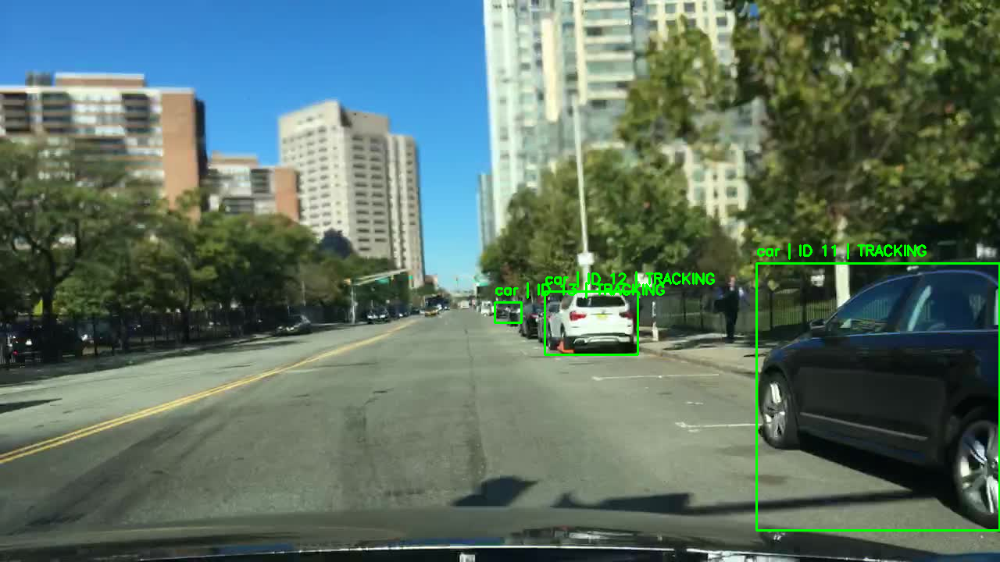


0: 384x640 2 cars, 1 traffic light, 8.5ms
Speed: 2.0ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 3 cars, 1 truck, 10.4ms
Speed: 2.1ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 cars, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 1 bus, 1 traffic light, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cars, 1 truck, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 2 cars, 1 truck, 8.9ms
Speed: 2.7ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 11.5ms
Speed: 1.7ms preprocess, 11

In [8]:
import cv2
import glob
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# =========================
# CONFIGURATION
# =========================
IMAGE_DIR = "/content/frames"
CONF_THRESH = 0.4
DIST_THRESHOLD = 60          # pixels (for tracking)
AREA_UP_THRESH = 1.05        # +5% area -> approaching
AREA_DOWN_THRESH = 0.95      # -5% area -> leaving

VEHICLE_CLASSES = ["car", "truck", "bus", "motorcycle"]

# =========================
# LOAD MODEL
# =========================
model = YOLO("yolov8n.pt")

# =========================
# LOAD IMAGE SEQUENCE
# =========================
image_paths = sorted(glob.glob(f"{IMAGE_DIR}/*.jpg"))

# =========================
# TRACKING STATE
# =========================
tracked_objects = {}   # id -> (cx, cy, area)
next_id = 0

def euclidean(p1, p2):
    return np.linalg.norm(np.array(p1) - np.array(p2))

# =========================
# MAIN LOOP
# =========================
for frame_idx, img_path in enumerate(image_paths):
    frame = cv2.imread(img_path)
    results = model(frame, conf=CONF_THRESH)[0]

    current_objects = {}

    for box in results.boxes:
        cls_id = int(box.cls[0])
        label = results.names[cls_id]

        # Only vehicles
        if label not in VEHICLE_CLASSES:
            continue

        # Bounding box
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cx = int((x1 + x2) / 2)
        cy = int((y1 + y2) / 2)
        area = (x2 - x1) * (y2 - y1)

        # =========================
        # MATCH TO PREVIOUS OBJECT
        # =========================
        matched_id = None
        min_dist = float("inf")

        for obj_id, (px, py, parea) in tracked_objects.items():
            dist = euclidean((cx, cy), (px, py))
            if dist < DIST_THRESHOLD and dist < min_dist:
                min_dist = dist
                matched_id = obj_id

        if matched_id is None:
            matched_id = next_id
            next_id += 1

        # =========================
        # DIRECTION LOGIC (ROBUST)
        # =========================
        direction = "TRACKING"

        if matched_id in tracked_objects:
            _, _, prev_area = tracked_objects[matched_id]

            if area > prev_area * AREA_UP_THRESH:
                direction = "APPROACHING"
            elif area < prev_area * AREA_DOWN_THRESH:
                direction = "LEAVING"

        # Update state
        current_objects[matched_id] = (cx, cy, area)

        # =========================
        # DRAW OUTPUT
        # =========================
        color = (0, 0, 255) if "APPROACHING" in direction else (0, 255, 0)

        cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
        cv2.putText(
            frame,
            f"{label} | ID {matched_id} | {direction}",
            (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            color,
            2
        )

    tracked_objects = current_objects

    # =========================
    # DISPLAY (LIMIT OUTPUT)
    # =========================
    if frame_idx < 5:
        cv2_imshow(frame)


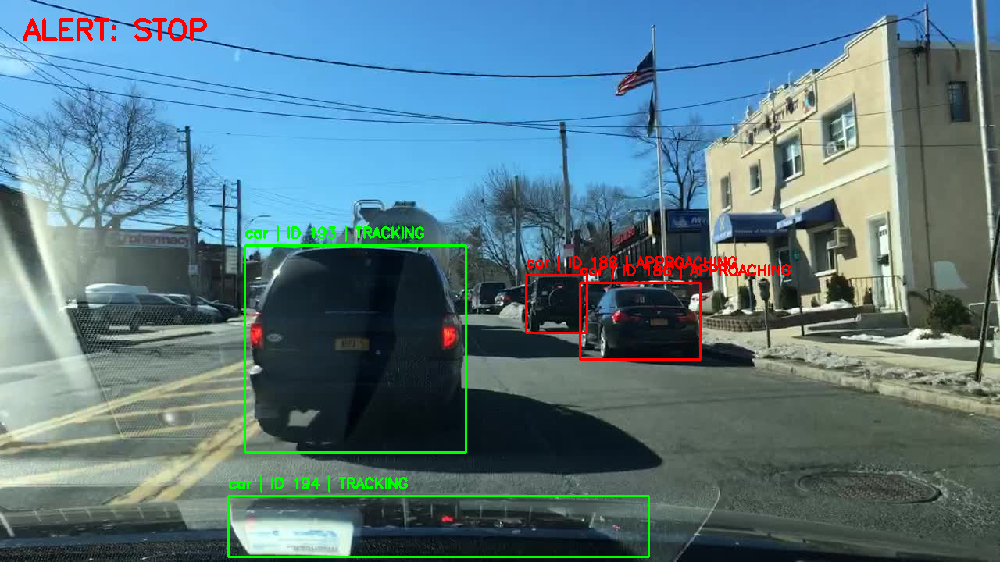

In [9]:
# =========================
# STEP 3: RISK & ALERT LOGIC (FINAL, DUPLICATE-PROOF)
# =========================

import cv2
from google.colab.patches import cv2_imshow

# -------------------------------------------------
# ALWAYS work on a CLEAN COPY of the frame
# -------------------------------------------------
clean_frame = frame.copy()

# -------------------------------------------------
# THRESHOLDS
# -------------------------------------------------
STOP_AREA_THRESH = 12000
SLOW_COUNT_THRESH = 2

approaching_near = 0
vehicle_count = 0

# -------------------------------------------------
# SCENE EVALUATION
# -------------------------------------------------
for obj_id, (cx, cy, area) in tracked_objects.items():
    vehicle_count += 1
    if area > STOP_AREA_THRESH:
        approaching_near += 1

# -------------------------------------------------
# DECISION LOGIC
# -------------------------------------------------
if approaching_near >= 1:
    alert = "STOP"
    alert_color = (0, 0, 255)      # Red
elif vehicle_count >= SLOW_COUNT_THRESH:
    alert = "SLOW"
    alert_color = (0, 255, 255)    # Yellow
else:
    alert = "GO"
    alert_color = (0, 255, 0)      # Green

# -------------------------------------------------
# DRAW ALERT (ONCE — ONLY HERE)
# -------------------------------------------------
cv2.putText(
    clean_frame,
    f"ALERT: {alert}",
    (30, 50),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.2,
    alert_color,
    3
)

# -------------------------------------------------
# DISPLAY
# -------------------------------------------------
cv2_imshow(clean_frame)


In [14]:
import os

image_dir = "/content/obstacles"
images = sorted(os.listdir(image_dir))

for idx, img in enumerate(images, start=1):
    new_name = f"block_{idx:03d}.jpg"
    os.rename(
        os.path.join(image_dir, img),
        os.path.join(image_dir, new_name)
    )


Image: /content/obstacles/block_003.jpg
Occupancy ratio: 0.316


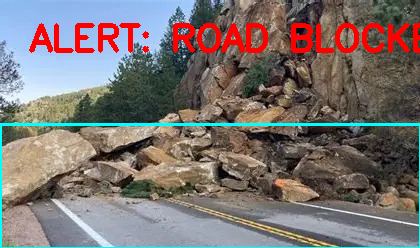

In [15]:
# =========================
# ROAD BLOCK DETECTION
# =========================

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image_path = "/content/obstacles/block_003.jpg"

frame = cv2.imread(image_path)

if frame is None:
    raise ValueError("Image not found. Check path.")

frame_copy = frame.copy()
h, w, _ = frame_copy.shape

road_roi = frame_copy[int(h*0.5):h, :]

gray = cv2.cvtColor(road_roi, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)
edges = cv2.Canny(blur, 50, 150)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
edges_closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

edge_pixels = np.count_nonzero(edges_closed)
total_pixels = edges_closed.shape[0] * edges_closed.shape[1]
occupancy_ratio = edge_pixels / total_pixels

ROAD_BLOCK_THRESH = 0.12
road_blocked = occupancy_ratio > ROAD_BLOCK_THRESH

if road_blocked:
    cv2.putText(
        frame_copy,
        "ALERT: ROAD BLOCKED",
        (30, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (0, 0, 255),
        3
    )
else:
    cv2.putText(
        frame_copy,
        "ROAD CLEAR",
        (30, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.2,
        (0, 255, 0),
        3
    )

cv2.rectangle(
    frame_copy,
    (0, int(h*0.5)),
    (w, h),
    (255, 255, 0),
    2
)

print(f"Image: {image_path}")
print(f"Occupancy ratio: {occupancy_ratio:.3f}")

cv2_imshow(frame_copy)


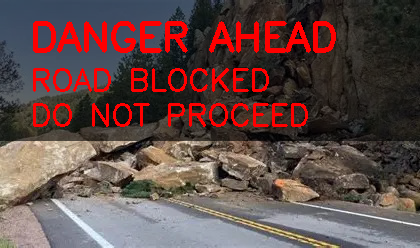

In [16]:
# ============================================
# FINAL OUTPUT
# ============================================

import cv2
from google.colab.patches import cv2_imshow

final_alert = "ROAD BLOCKED"

image_path = "/content/obstacles/block_003.jpg"
frame = cv2.imread(image_path)

if frame is None:
    raise ValueError("Image not found.")

story_frame = frame.copy()

overlay = story_frame.copy()
cv2.rectangle(
    overlay,
    (0, 0),
    (story_frame.shape[1], 140),
    (0, 0, 0),
    -1
)
story_frame = cv2.addWeighted(overlay, 0.6, story_frame, 0.4, 0)

if final_alert == "ROAD BLOCKED":
    headline = "DANGER AHEAD"
    message = "ROAD BLOCKED\nDO NOT PROCEED"
    color = (0, 0, 255)

elif final_alert == "STOP":
    headline = "WARNING"
    message = "ONCOMING VEHICLE\nWAIT"
    color = (0, 0, 255)

elif final_alert == "SLOW":
    headline = "CAUTION"
    message = "LIMITED VISIBILITY\nPROCEED SLOWLY"
    color = (0, 255, 255)

else:  # GO
    headline = "SAFE"
    message = "ROAD CLEAR\nPROCEED"
    color = (0, 255, 0)

cv2.putText(
    story_frame,
    headline,
    (30, 50),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.3,
    color,
    3

y = 90
for line in message.split("\n"):
    cv2.putText(
        story_frame,
        line,
        (30, y),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.0,
        color,
        2
    )
    y += 35

cv2_imshow(story_frame)
